# Setup env

In [ ]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-l17m221d
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-l17m221d
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import os
# from tqdm import tqdm
from tqdm.notebook import tqdm
import pathlib
import random
import math
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import cosine_distances

from datasets import load_dataset
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler

from PIL import Image
import torchvision
from torchvision import transforms, datasets
import clip
from typing import Tuple

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.collections as mcoll

from pydantic import BaseModel

from IPython.display import display
import sys

# clone my repo
! git clone https://github.com/alexandraizhevskaya/sae.git

Cloning into 'sae'...
remote: Enumerating objects: 13, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 13 (delta 0), reused 10 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (13/13), 11.53 MiB | 34.22 MiB/s, done.


In [ ]:
sys.path.append("/content/sae/src")

In [ ]:
from config import TrainParams
from dataset import ClipImageDataset
from model import TopKSAE
from train import train_sae_model
from utils import (get_img_emdeddings, get_active_neurons, visualize_results,
                   display_images_row, plot_tsne, find_closest, get_tokens,
                   save_npy, load_npy, identify_dead_neurons,
                   explained_variance_full, normalized_mean_absolute_error,
                   l0_messure, score_representations)

# Load data and sources

In [ ]:
! wget http://images.cocodataset.org/zips/train2017.zip -O coco_train2017.zip
! wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O coco_ann2017.zip
! unzip /content/coco_train2017.zip

In [ ]:
print(f"Number of images: {len(os.listdir('/content/train2017'))}")

Number of images: 118287


In [ ]:
# load model
clip_model, preprocess = clip.load('ViT-B/32', device='cuda')

100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 141MiB/s]


# Trining params

In [ ]:
# SET CONFIG
INPUT_DIM = 512
training_params = {
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "batch_img": 64,
    "batch_sae": 128,
    "input_d": INPUT_DIM,
    "latent_n": INPUT_DIM*8,
    "epochs_sae": 100,
    "lambda_": 1e-3*2,
    "alpha": 0.03,
    "top_k": 512,
    "num_b": 50,
    "lr_sae": 1e-3,
    "weight_decay": 1e-4,
    "img_path": '/content/train2017',
    "seed": 42,
    "save_file": "topk_sae_relu_clip32.pt"
}

training_params = TrainParams(**training_params)

In [ ]:
torch.manual_seed(training_params.seed)
np.random.seed(training_params.seed)
random.seed(training_params.seed)

# Datasets

In [ ]:
# prepare data
paths = list(map(lambda x: os.path.join(training_params.img_path, x), os.listdir(training_params.img_path)))

index = np.arange(len(paths))
np.random.shuffle(index)

train_size, val_size = int(0.8*len(index)), int(0.1*len(index))
train_index = index[:train_size]
val_index = index[train_size:train_size + val_size]
test_index = index[train_size + val_size:]

# dataset and loaders for embedding extraction
dataset = ClipImageDataset(paths, preprocess)
loader = DataLoader(dataset, batch_size=training_params.batch_img, shuffle=False)

train_dataset = ClipImageDataset(np.array(paths)[train_index], preprocess)
train_loader = DataLoader(train_dataset, batch_size=training_params.batch_img, shuffle=False)

In [ ]:
# get sae features - clip outputs
X_embed = get_img_emdeddings(loader, clip_model)
print("Embedded images size:", X_embed.shape)

In [ ]:
# save
output_path = 'clip_features.npy'
save_npy(X_embed, output_path)

In [ ]:
# load if presaved
output_path = '/content/clip_features.npy'
X_embed = load_npy(output_path)

In [ ]:
# dataset and loaders for sae
X_train_clf = X_embed[train_index]
X_val_clf = X_embed[val_index]

train_sae = torch.utils.data.TensorDataset(X_train_clf)
val_sae = torch.utils.data.TensorDataset(X_val_clf)

train_loader_sae = DataLoader(train_sae, batch_size=training_params.batch_sae, shuffle=True,  pin_memory=True)
val_loader_sae = DataLoader(val_sae, batch_size=training_params.batch_sae, shuffle=False, pin_memory=True)

# Training

In [ ]:
sae, train_losses, val_losses = train_sae_model(train_loader_sae, val_loader_sae, train_loader,
                                                train_sae, val_sae,
                                                training_params, clip_model)

# Result analisys

In [ ]:
https://drive.google.com/file/d/1UjcblgA3SrsBrIO9hAZ5ofMmsjKQx3Pi/view?usp=sharing

In [ ]:
! gdown https://drive.google.com/uc?id=1UjcblgA3SrsBrIO9hAZ5ofMmsjKQx3Pi

Downloading...
From: https://drive.google.com/uc?id=1UjcblgA3SrsBrIO9hAZ5ofMmsjKQx3Pi
To: /content/topk_sae_relu_clip32.pt
100% 16.8M/16.8M [00:00<00:00, 37.6MB/s]


In [ ]:
# load from checkpoints
device =  "cuda" if torch.cuda.is_available() else "cpu"
sae = TopKSAE(input_d=training_params.input_d,
              latent_n=training_params.latent_n,
              top_k=training_params.top_k,
              lambda_=training_params.lambda_).to(training_params.device)

checkpoint = torch.load("/content/topk_sae_relu_clip32.pt", map_location=device)
sae.load_state_dict(checkpoint)

<All keys matched successfully>

## Loss graphics and metrics

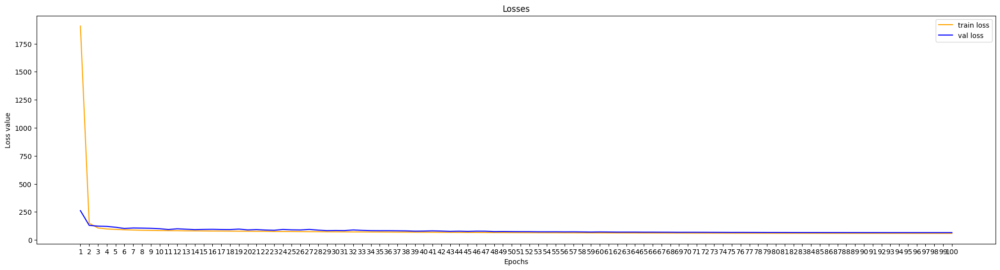

In [ ]:
visualize_results(train_losses, val_losses)

In [ ]:
res = score_representations(sae, train_loader_sae, training_params.device)

## Qualitative analysis

In [ ]:
# get latents from sae
paths_val = np.array(paths)[val_index]

latents = []
# decoded = []
for (imgs,) in tqdm(val_loader_sae):
  imgs=imgs.to(training_params.device)
  with torch.no_grad():
    _, z, d = sae(imgs)
    latents.append(z.cpu())
    # decoded.append(d.cpu())
latents = torch.cat(latents, axis=0)
# decoded = torch.cat(decoded, axis=0)

### Active neurons

In [ ]:
active = get_active_neurons(latents, 2)

In [ ]:
# Count active neurons with threshold 2
dict_cls = {}
for i, actives in enumerate(active):
  for active in actives:
    if active not in dict_cls:
      dict_cls[active] = [i]
    else:
      dict_cls[active].append(i)

len(dict_cls.keys())

203

In [ ]:
cnts = {}
for k, v in dict_cls.items():
    cnts[k] = len(v)

cnt_df = pd.DataFrame(sorted(cnts.items(), key=lambda x: x[1], reverse=True), columns=["cluster", "cnt"])
cnt_df.head()

,cluster,cnt
0,277,981
1,3749,856
2,1664,730
3,492,629
4,3014,624


Examples of pictures with the same active values

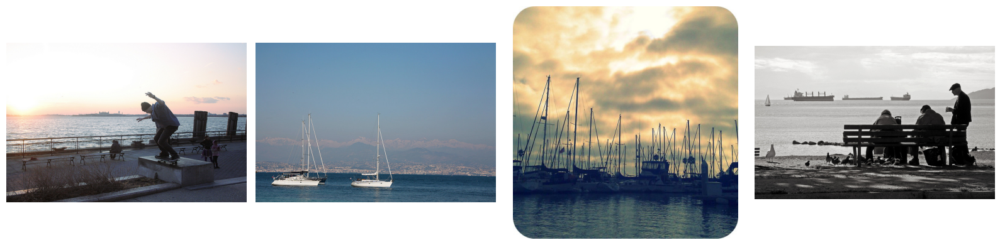

In [ ]:
# 1916

idxes = [32, 945, 1633, 2369]
img_cls_paths = [paths_val[i] for i in idxes]
display_images_row(img_cls_paths)

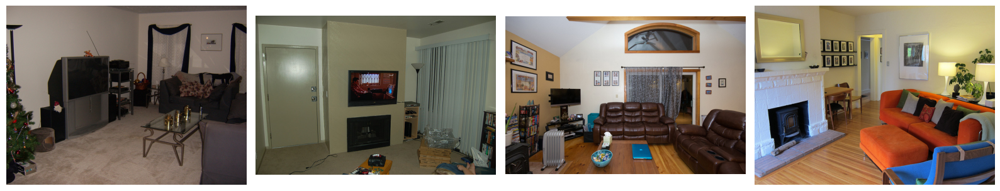

In [ ]:
# 2620

idxes = [336, 1595, 2703, 3239]
img_cls_paths = [paths_val[i] for i in idxes]
display_images_row(img_cls_paths)

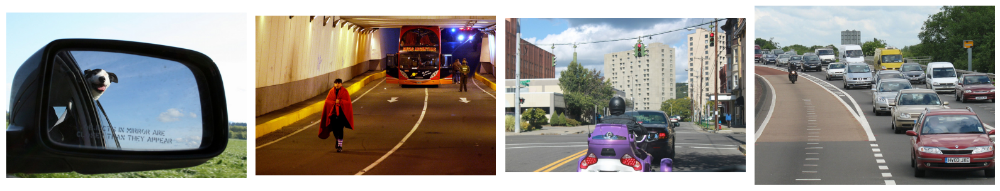

In [ ]:
# 2620

idxes = [64, 3332, 9988, 11098]
img_cls_paths = [paths_val[i] for i in idxes]
display_images_row(img_cls_paths)

### Latent space: clustering

In [ ]:
# kmeans
num_clusters = 200
km = KMeans(num_clusters)
km.fit(latents)

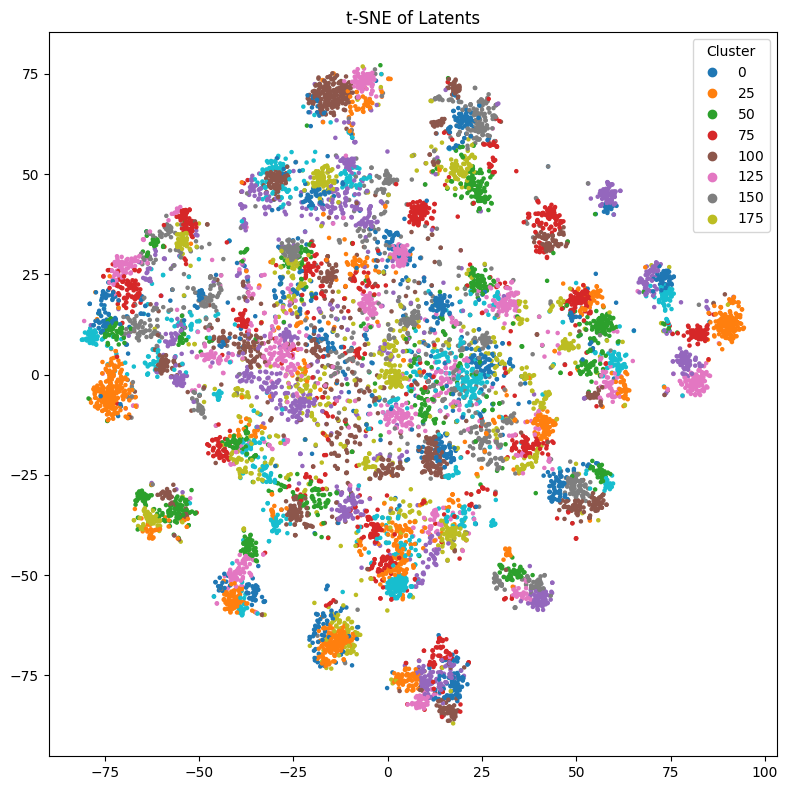

In [ ]:
plot_tsne(latents, km)

In [ ]:
# nearest neighbours
kn =  NearestNeighbors().fit(latents)

Query


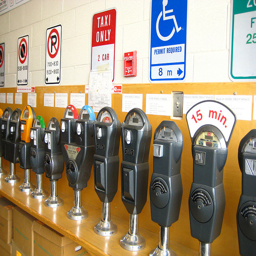


Closesest


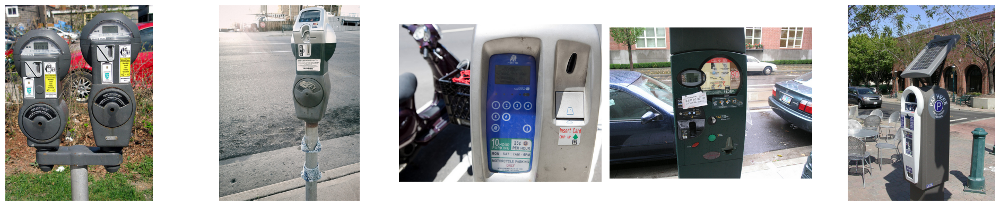

In [ ]:
find_closest(kn, latents, 6, paths_val)

Query


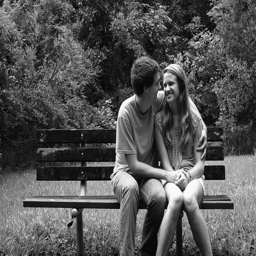


Closesest


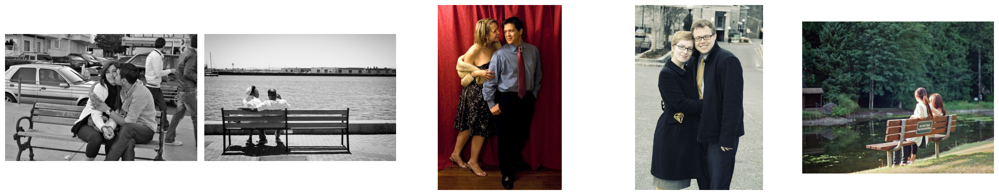

In [ ]:
find_closest(kn, latents, 45, paths_val)

Query


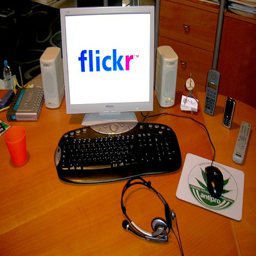


Closesest


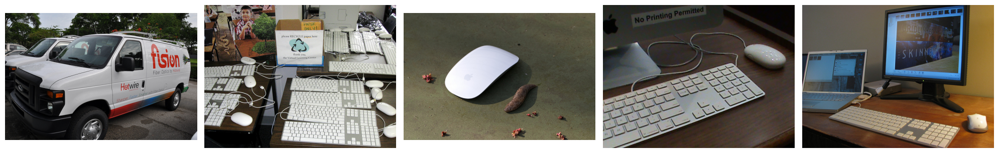

In [ ]:
find_closest(kn, latents, 670, paths_val)

Query


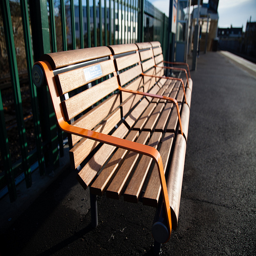


Closesest


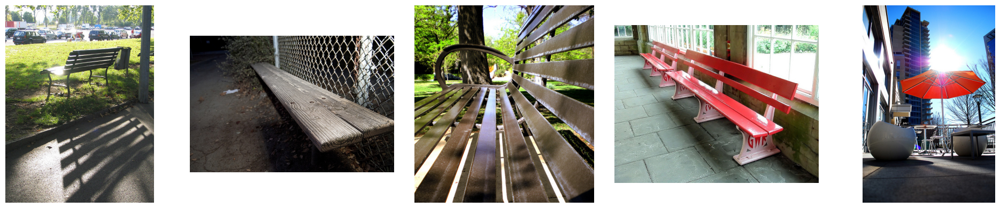

In [ ]:
find_closest(kn, latents, 9006, paths_val)

### Finding concepts

In [ ]:
# torch.cuda.empty_cache()

In [ ]:
concepts, concept_emb = get_tokens(clip_model, "/content/mscoco_unigram.txt", training_params.device)

In [ ]:
cs = cosine_distances(concept_emb, (sae.W_dec ).cpu().detach().numpy().T) # + sae.bias[:, None]

idx = cs.argmin(axis=0)
nearest_concepts = [concepts[i] for i in idx]

In [ ]:
cnt_df[:10]

,cluster,cnt
0,4020,781
1,3442,765
2,3591,757
3,1922,731
4,2060,703
5,1609,596
6,2760,550
7,1135,517
8,2597,499
9,1856,490


Images with similar activations + concepts found in them

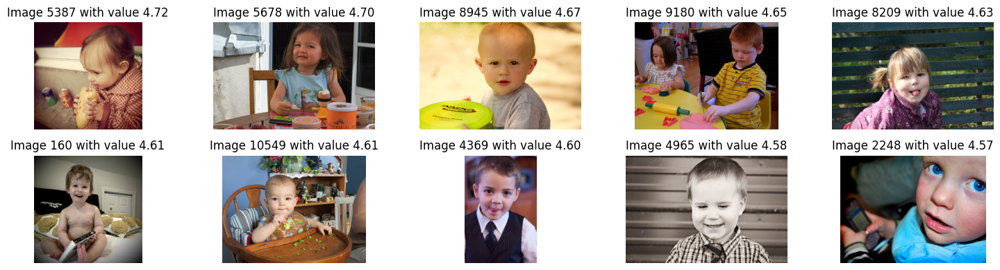

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(15, 4))
vals, indices = latents[:, 1856].topk(10)
top_images = [paths_val[i] for i in  indices]
for i, axi in enumerate(ax.ravel()):
    axi.imshow(Image.open(top_images[i]).convert('RGB'))
    axi.axis('off')
    axi.set_title(f'Image {indices[i]} with value {vals[i].item():.2f}')
plt.tight_layout()
plt.show()

argmax index: 1856, value: preschool


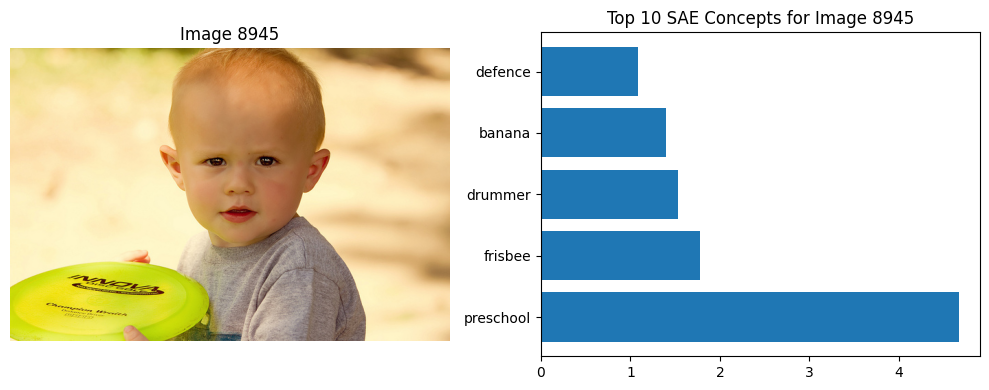

In [ ]:
image_index = 8945
max_feat = latents[image_index].argmax()
top_5_feat = list(latents[image_index].argsort().numpy())[-5:][::-1]
top_5_vals = list(latents[image_index].sort().values.numpy())[-5:][::-1]
top_5_conc = [nearest_concepts[i] for i in top_5_feat]

print(f'argmax index: {max_feat}, value: {nearest_concepts[max_feat]}')
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(Image.open(paths_val[image_index]).convert('RGB'))
ax[0].axis('off')
ax[0].set_title(f'Image {image_index}')
ax[1].barh(range(5), np.array(top_5_vals))
ax[1].set_yticks(range(5))
ax[1].set_yticklabels(top_5_conc)
ax[1].set_title(f'Top 10 SAE Concepts for Image {image_index}')
plt.tight_layout()
plt.show()

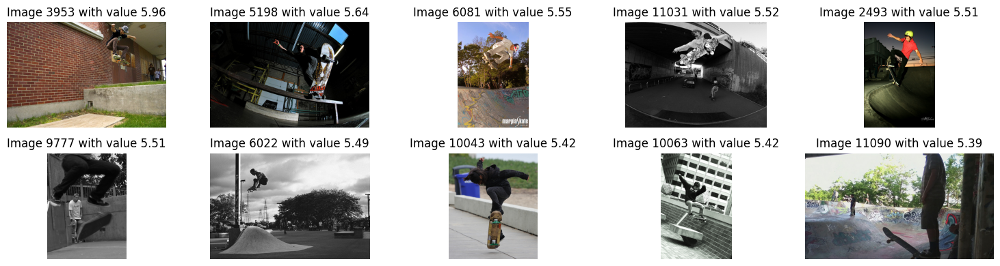

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(15, 4))
vals, indices = latents[:, 1609].topk(10)
top_images = [paths_val[i] for i in  indices]
for i, axi in enumerate(ax.ravel()):
    axi.imshow(Image.open(top_images[i]).convert('RGB'))
    axi.axis('off')
    axi.set_title(f'Image {indices[i]} with value {vals[i].item():.2f}')
plt.tight_layout()
plt.show()

argmax index: 1609, value: skateboarding


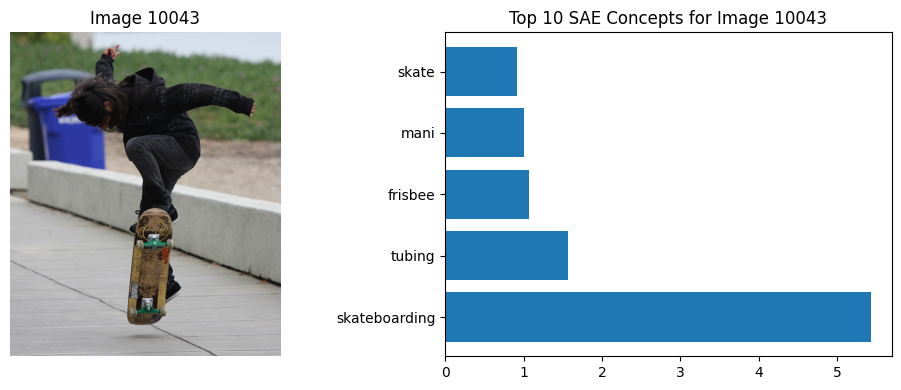

In [ ]:
image_index = 10043
max_feat = latents[image_index].argmax()
top_5_feat = list(latents[image_index].argsort().numpy())[-5:][::-1]
top_5_vals = list(latents[image_index].sort().values.numpy())[-5:][::-1]
top_5_conc = [nearest_concepts[i] for i in top_5_feat]

print(f'argmax index: {max_feat}, value: {nearest_concepts[max_feat]}')
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(Image.open(paths_val[image_index]).convert('RGB'))
ax[0].axis('off')
ax[0].set_title(f'Image {image_index}')
ax[1].barh(range(5), np.array(top_5_vals))
ax[1].set_yticks(range(5))
ax[1].set_yticklabels(top_5_conc)
ax[1].set_title(f'Top 10 SAE Concepts for Image {image_index}')
plt.tight_layout()
plt.show()

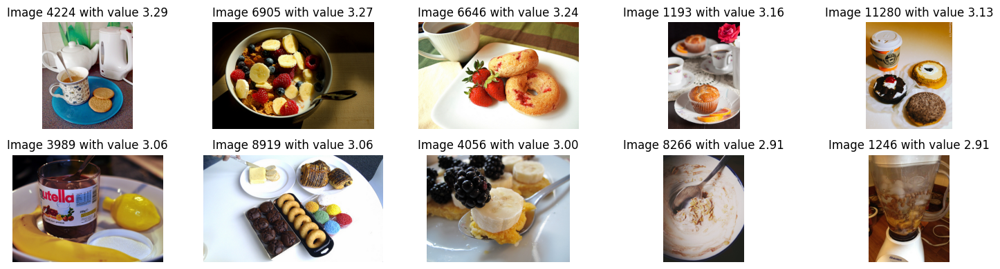

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(15, 4))
vals, indices = latents[:, 964].topk(10)
top_images = [paths_val[i] for i in  indices]
for i, axi in enumerate(ax.ravel()):
    axi.imshow(Image.open(top_images[i]).convert('RGB'))
    axi.axis('off')
    axi.set_title(f'Image {indices[i]} with value {vals[i].item():.2f}')
plt.tight_layout()
plt.show()

argmax index: 964, value: desserts


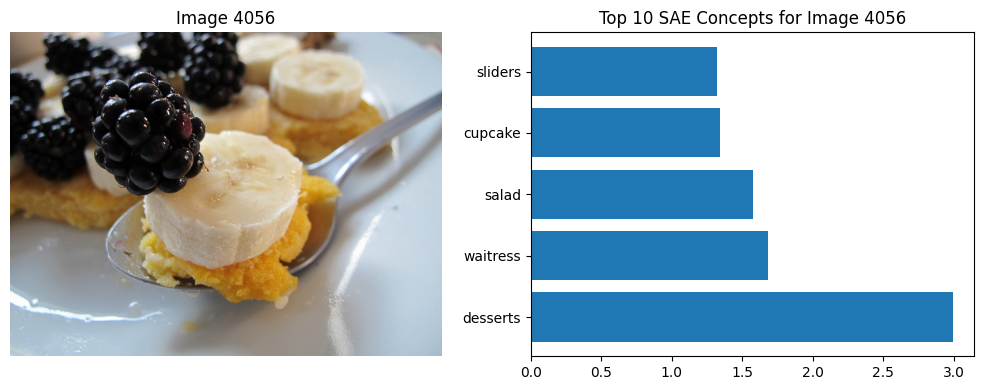

In [ ]:
image_index = 4056
max_feat = latents[image_index].argmax()
top_5_feat = list(latents[image_index].argsort().numpy())[-5:][::-1]
top_5_vals = list(latents[image_index].sort().values.numpy())[-5:][::-1]
top_5_conc = [nearest_concepts[i] for i in top_5_feat]

print(f'argmax index: {max_feat}, value: {nearest_concepts[max_feat]}')
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(Image.open(paths_val[image_index]).convert('RGB'))
ax[0].axis('off')
ax[0].set_title(f'Image {image_index}')
ax[1].barh(range(5), np.array(top_5_vals))
ax[1].set_yticks(range(5))
ax[1].set_yticklabels(top_5_conc)
ax[1].set_title(f'Top 10 SAE Concepts for Image {image_index}')
plt.tight_layout()
plt.show()

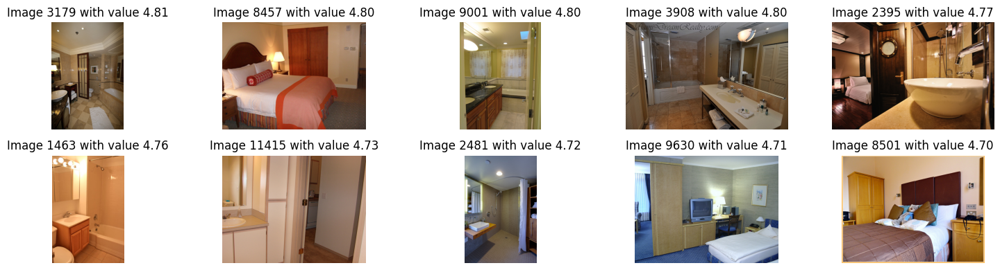

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(15, 4))
vals, indices = latents[:, 3749].topk(10)
top_images = [paths_val[i] for i in  indices]
for i, axi in enumerate(ax.ravel()):
    axi.imshow(Image.open(top_images[i]).convert('RGB'))
    axi.axis('off')
    axi.set_title(f'Image {indices[i]} with value {vals[i].item():.2f}')
plt.tight_layout()
plt.show()

argmax index: 3749, value: bedroom


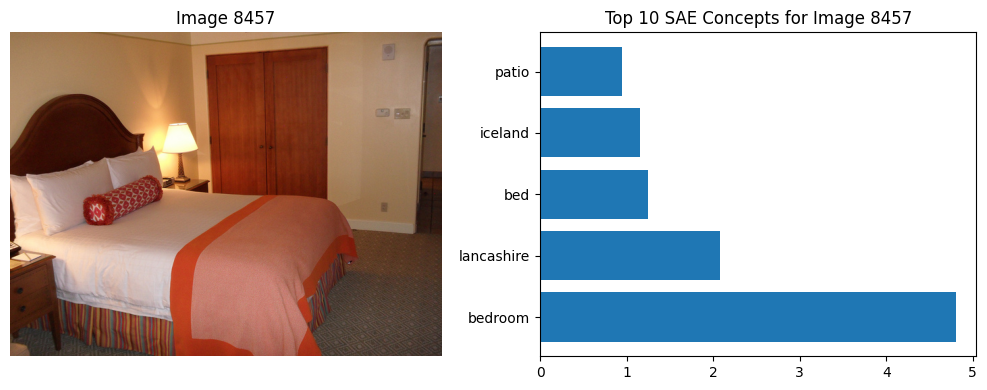

In [ ]:
image_index = 8457
max_feat = latents[image_index].argmax()
top_5_feat = list(latents[image_index].argsort().numpy())[-5:][::-1]
top_5_vals = list(latents[image_index].sort().values.numpy())[-5:][::-1]
top_5_conc = [nearest_concepts[i] for i in top_5_feat]

print(f'argmax index: {max_feat}, value: {nearest_concepts[max_feat]}')
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(Image.open(paths_val[image_index]).convert('RGB'))
ax[0].axis('off')
ax[0].set_title(f'Image {image_index}')
ax[1].barh(range(5), np.array(top_5_vals))
ax[1].set_yticks(range(5))
ax[1].set_yticklabels(top_5_conc)
ax[1].set_title(f'Top 10 SAE Concepts for Image {image_index}')
plt.tight_layout()
plt.show()

Search by concept and looking at other concepts in similar imaes

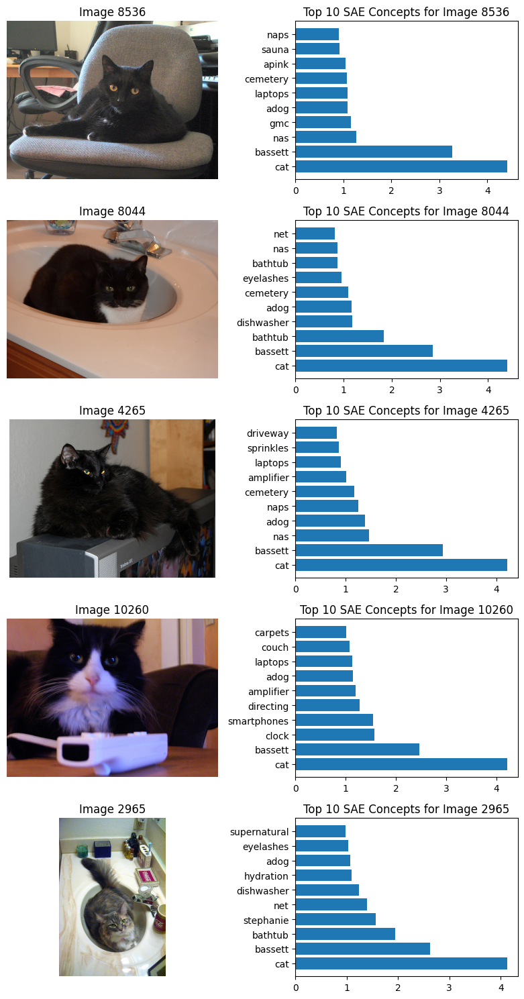

In [ ]:
neuron_index = nearest_concepts.index('cat')
top_5_cat = latents[:, neuron_index].topk(5)
fig, ax = plt.subplots(5, 2, figsize=(8, 15))
for i, idx in enumerate(top_5_cat.indices.cpu().numpy()):
    top_10 = latents[idx].topk(10)
    ax[i, 0].imshow(Image.open(paths_val[idx]).convert('RGB'))
    ax[i, 0].axis('off')
    ax[i, 0].set_title(f'Image {idx}')
    ax[i, 1].barh(range(10), top_10.values.cpu().numpy())
    ax[i, 1].set_yticks(range(10))
    top_10_vals = [nearest_concepts[i] for i in top_10.indices]
    ax[i, 1].set_yticklabels(np.array(top_10_vals))
    ax[i, 1].set_title(f'Top 10 SAE Concepts for Image {idx}')
plt.tight_layout()
plt.show()


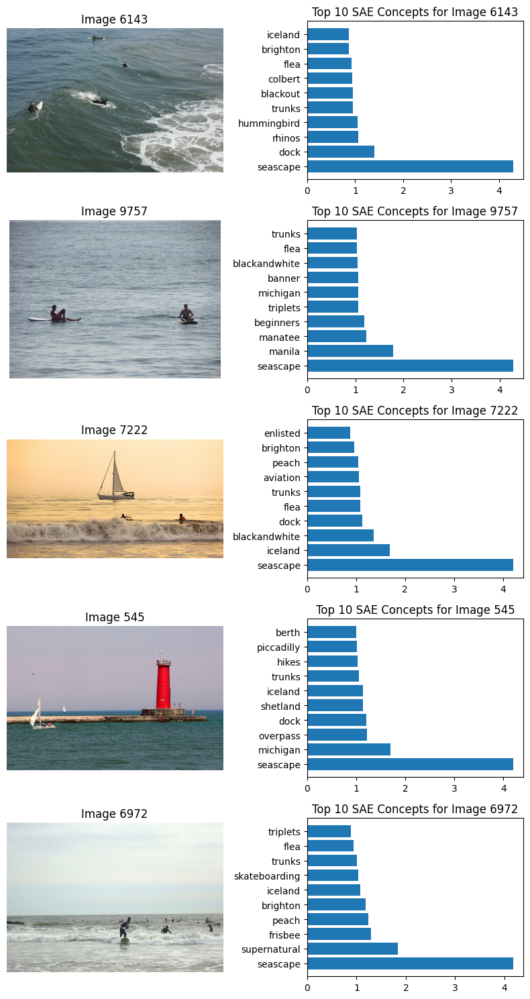

In [ ]:
neuron_index = nearest_concepts.index('seascape')
top_5_cat = latents[:, neuron_index].topk(5)
fig, ax = plt.subplots(5, 2, figsize=(8, 15))
for i, idx in enumerate(top_5_cat.indices.cpu().numpy()):
    top_10 = latents[idx].topk(10)
    ax[i, 0].imshow(Image.open(paths_val[idx]).convert('RGB'))
    ax[i, 0].axis('off')
    ax[i, 0].set_title(f'Image {idx}')
    ax[i, 1].barh(range(10), top_10.values.cpu().numpy())
    ax[i, 1].set_yticks(range(10))
    top_10_vals = [nearest_concepts[i] for i in top_10.indices]
    ax[i, 1].set_yticklabels(np.array(top_10_vals))
    # ax[i, 1].set_yticklabels([nearest_concepts[latents[:, j].argmax()]+f"/{j}" for j in top_10.indices.cpu().numpy()])
    ax[i, 1].set_title(f'Top 10 SAE Concepts for Image {idx}')
plt.tight_layout()
plt.show()